# Practical 4 — Sequence-based data analysis (Visium HD)

**Course:** MGC-BioSB-Spatial-Omics-Analysis-2025  
**Session time:** 11/11/2025 13:15–14:45 (90 minutes)  
**Instructor:** Willem de Koning  
**Contact:** w.dekoning.1@erasmusmc.nl  
**Technical Assistant:** *Myrthe van Baardwijk*  

---

### 🎯 Learning goals

By completing this practical, you will be able to:

1. **Load and explore Visium HD spatial data**  
   → Understand the structure of the Space Ranger output and verify tissue alignment.

2. **Compute and interpret spatial QC metrics**  
   → Calculate total counts, detected genes, and % mitochondrial reads,  
   and visualize them in both histogram and spatial context.

3. **Filter low-quality bins carefully**  
   → Apply gentle, spatially informed thresholds to retain biological signal  
   while removing technical background.

4. **Normalize gene expression and select Highly Variable Genes (HVGs)**  
   → Perform log normalization, explore mean–variance relationships,  
   and interpret the biological meaning of HVGs.

5. **Reduce dimensionality and explore structure (PCA & embedding)**  
   → Use PCA to summarize gene expression variation and build a  
   quick illustrative UMAP + Leiden clustering to visualize spatial structure.

6. **Reflect on QC and normalization decisions**  
   → Evaluate how different thresholds and normalization strategies affect spatial patterns and downstream interpretation.

**💡 Why this matters**

In sequencing-based spatial transcriptomics (SRT), we perform steps familiar from single-cell RNA-seq — **Quality control → Normalization → Feature selection → Dimensionality reduction** — but the **spatial context** changes how we interpret and apply them.

Unlike dissociated scRNA-seq:
- **Low-count regions** may represent real biology (e.g. sparse stroma, necrotic areas), not poor quality.  
- **High mitochondrial percentages** can reflect tissue composition or metabolic state.  
- **Filtering decisions** must consider both the data *and* the tissue image.

This practical will teach you to **combine quantitative QC plots with visual inspection** to make biologically aware choices, avoiding the loss of meaningful spatial regions while maintaining data integrity for downstream analysis.

> 🧭 The goal is not just to “clean” the data, but to **understand what quality means in a spatial context**.


---

### Biological context — the Visium HD breast tissue sample (square_008um)

The dataset used in this practical is the **Visium HD Breast Cancer** demo dataset from 10x Genomics, specifically the **square_008um** binning level.  
This means each expression bin represents a **square area of 8 µm × 8 µm** on the tissue section, providing near single-cell spatial resolution.

🔗 **[10x Genomics – Visium HD CytAssist Gene Expression (Human Breast Cancer FFPE)](https://www.10xgenomics.com/datasets/visium-hd-cytassist-gene-expression-libraries-human-breast-cancer-ffpe-if)**

This human breast tissue section includes both **cancerous epithelial structures** and **stromal components** such as adipose tissue and connective regions.  
Key biological and spatial features:

- **Tumor heterogeneity:** malignant epithelial cells intermixed with stromal fibroblasts and immune cells.  
- **Distinct metabolic zones:** mitochondrial gene expression and total UMI counts can differ between tumor core and stroma.  
- **Histological diversity:** regions rich in ducts, necrotic tissue, or background may exhibit lower capture efficiency.  

---

### 🧬 Sample information

The **Visium HD Breast Cancer (square_008um)** dataset represents a **human female breast cancer (ductal carcinoma in situ)** FFPE section obtained from *Avaden Biosciences* (sample quality 37.2 DV200).

**Preparation & Imaging**
- 5 µm FFPE tissue section prepared according to the *Visium HD FFPE Tissue Preparation Handbook (CG000684)*.  
- Stained using **immunofluorescence (IF)**:
  - **CD45RO (Alexa 594)** → T cells and immune infiltrate  
  - **CD20 (Alexa 488)** → B cells  
  - **DAPI** → nuclei counterstain  
- Imaged using the **Visium CytAssist** platform with a 20× objective prior to spatial transcriptome capture.

**Molecular assay**
- Processed with the **Visium HD Spatial Gene Expression Reagent Kit (CG000685)**  
  and **Visium Human Transcriptome Probe Set v2.0**.  
- Sequenced on an **Illumina NovaSeq 6000** (≈ 360 M reads, paired-end).  
- Data processed using **Space Ranger v3.1.2**, which generated the gene × barcode matrix and spatial coordinates.

These details are useful for interpreting the biological and technical variation we’ll see during QC:
- Regions high in **CD45RO/CD20** signal correspond to **immune infiltration**.  
- Differences in **library size** or **mitochondrial percentage** across the slide can reflect both **cell-type composition** and **tissue processing effects** (e.g., FFPE degradation or permeabilization).

---

### From sequencing to spatial transcriptomics data

Before diving into the analysis, let’s recall how sequencing-based SRT data are generated and processed.  
*(See the lecture slides: “Sequencing-based SRT” and “Preprocessing SRT data”.)*  

#### What is **Space Ranger** (and how it relates to **Cell Ranger**)?

- **Cell Ranger** is 10x Genomics’ software for **single-cell RNA-seq** data processing.  
- **Space Ranger** is the corresponding pipeline for **spatial transcriptomics** with **Visium** and **Visium HD** assays.  
- Both perform similar steps:  
  1. **Read alignment** to a reference genome or transcriptome.  
  2. **Barcode and UMI processing** — assigning reads to barcodes (spots/bins) and collapsing UMIs.  
  3. **Count matrix generation** — creating the gene × barcode matrix that we use in Python tools like Scanpy.  
- For **Visium HD**, Space Ranger also **maps each barcode/bin to its exact position on the H&E image** (via CytAssist registration).  
  These coordinates allow spatial visualization and tissue-context analysis.

---

### Dataset: Space Ranger output (input for our practical)

A processed **Space Ranger Output** archive typically contains:

```
├── filtered_feature_bc_matrix.h5     # genes × barcodes count matrix
├── spatial/
│   ├── scalefactors_json.json        # pixel scaling & spot-size info
│   ├── tissue_positions.parquet      # barcode coordinates (pixels)
│   ├── tissue_hires_image.png        # high-resolution H&E image
│   └── tissue_lowres_image.png       # low-resolution image for plotting
```

These files define both the **expression data** and the **spatial layout** of the Visium HD slide.  
We will **not rerun Space Ranger** — instead, we will analyze the processed output in Python using **Scanpy** and **Squidpy**.

---

<div style="border: 2px solid #d9534f; border-radius: 8px; padding: 12px; background-color: #fff5f5;">

### 🧠 Reflection (before you start)

**Q1.** Why is a **visual inspection** of the H&E image useful *before* running QC?  
<details>
<summary>💬 Click to reveal the answer</summary>

Visual inspection confirms tissue integrity, correct orientation, and identifies damaged, folded, or empty areas.  
This ensures that apparent low-quality regions in QC plots are interpreted correctly — e.g., distinguishing real biological sparsity from technical artifacts.
</details>

---

**Q2.** Which QC signals (total counts, genes detected, %MT) might reflect **biology** rather than **technical noise**?  
<details>
<summary>💬 Click to reveal the answer</summary>

- **Total counts / detected genes** can vary with tissue density — tumor vs. stroma differences are expected.  
- **% mitochondrial reads** may reflect metabolic differences rather than poor data quality.  
Thus, QC thresholds should be interpreted in *spatial context*, not applied uniformly across the tissue.
</details>

</div>


## **Part 1: Load and explore Visium HD spatial data** 

In this section, we will:
1. Import required Python libraries.  
2. Load the **Visium HD Breast (square 008 µm)** dataset from the local `data/` folder.  
3. Verify that spatial coordinates and the histology image are correctly linked (alignment already done by Space Ranger).  
4. Visually inspect the tissue before quality control.

---

### 1.1 Environment setup

We’ll start by importing all required libraries for this practical.
Only Squidpy and Scanpy are used in later steps; the rest are for visualization and I/O.

In [ ]:
# --- Environment & reproducibility ---
import warnings
warnings.filterwarnings("ignore")  # hide known future/deprecation warnings

from pathlib import Path
import importlib.metadata as im
import numpy as np
import pandas as pd
import scanpy as sc
import squidpy as sq
import matplotlib.pyplot as plt

# --- Version info ---
def pkg_version(pkg):
    try:
        return im.version(pkg)
    except im.PackageNotFoundError:
        return "not installed"

print(f"Scanpy version: {pkg_version('scanpy')}")
print(f"Squidpy version: {pkg_version('squidpy')}")

# --- Visualization defaults ---
sc.set_figure_params(figsize=(5, 5), dpi=100)
plt.rcParams["axes.grid"] = False

# --- Confirm environment ---
print("Environment ready ✅")

Scanpy version: 1.11.5
Squidpy version: 1.6.5
Environment ready ✅


### 1.2 Loading the Visium HD *square 008 µm* data

We will now load the **binned 8 µm Visium HD breast cancer** dataset from the local `data/` folder.  
The function `scanpy.read_visium()` automatically reads the expression matrix  
(`filtered_feature_bc_matrix.h5`) and links it to the spatial metadata in the `spatial/` subfolder.

> 💡 The `data/` folder should sit **next to this notebook** in your project directory.  
> In a standard 10x Genomics workflow, this corresponds to the **Space Ranger output** directory.  
> We start from this point rather than raw FASTQ files, since Space Ranger has already  
> performed alignment, barcode assignment, and spatial registration.

In [2]:
# === Load data (Visium HD friendly after update) ===
DATA_DIR = Path("data")
IMAGE_DIR = DATA_DIR / "spatial"

adata = sq.read.visium(path=DATA_DIR, load_images=True, source_image_path=IMAGE_DIR)

adata.var_names_make_unique()
adata.uns["dataset_name"] = "Visium HD Breast (8 µm bins)"

n_spots, n_genes = adata.shape
img_keys = list(adata.uns.get("spatial", {}).keys()) or "None"
print(f"✅ Data successfully loaded: {adata.uns['dataset_name']}")
print(f"   Spots (bins): {n_spots:,}")
print(f"   Genes: {n_genes:,}")
print(f"   Image keys available: {img_keys}")


✅ Data successfully loaded: Visium HD Breast (8 µm bins)
   Spots (bins): 663,857
   Genes: 18,085
   Image keys available: ['Visium_HD_Human_Breast_Cancer_FFPE']


### 1.3 Alignment check

Correct spatial alignment ensures that expression spots correspond to the right physical regions (tumor, stroma, background).
This is essential before interpreting any biological pattern.

> 🧭 **Spatial alignment note**  
> The Visium HD assay requires aligning the tissue image with the physical capture area on the slide.  
> This *registration* is performed by **10x Space Ranger** (and can be inspected/adjusted in **Loupe Browser**).  
> In this dataset, the alignment is **already complete** — the spatial barcodes in `tissue_positions.parquet`
> are registered to the image provided in the `spatial/` folder.

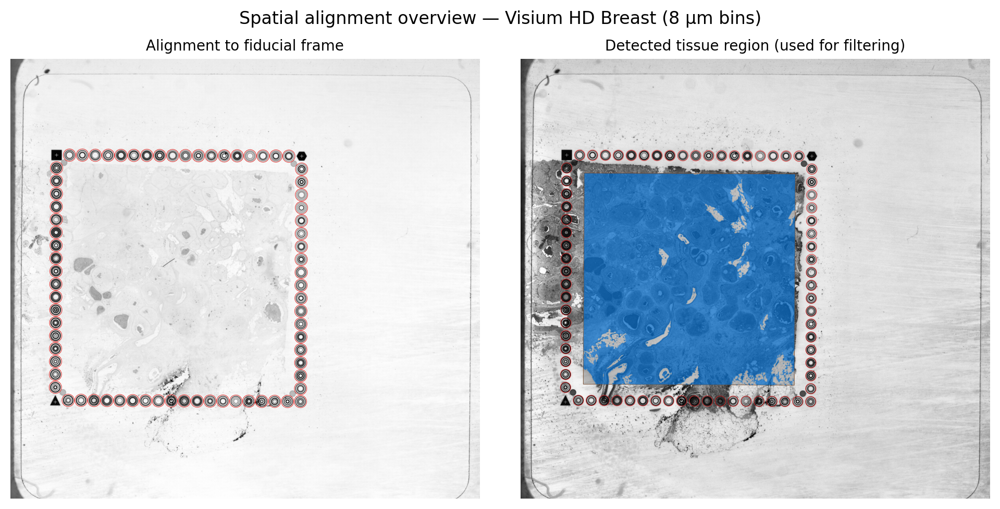

In [ ]:
# === Show alignment and tissue detection images (from Space Ranger output) ===
spatial_dir = DATA_DIR / "spatial"
img_files = [
    ("aligned_fiducials.jpg", "Alignment to fiducial frame"),
    ("detected_tissue_image.jpg", "Detected tissue region (used for filtering)")
]

fig, axes = plt.subplots(1, len(img_files), figsize=(10, 5))
for ax, (fname, title) in zip(axes, img_files):
    path = spatial_dir / fname
    if path.exists():
        img = Image.open(path)
        ax.imshow(img)
        ax.axis("off")
        ax.set_title(title, fontsize=10)
    else:
        ax.text(0.5, 0.5, f"{fname} not found", ha="center", va="center")

plt.suptitle("Spatial alignment overview — Visium HD Breast (8 µm bins)", fontsize=12)
plt.tight_layout()
plt.show()


### 1.4 Visual QC of alignment

Before running any QC, it’s important to **visually confirm that the tissue image and spot grid align**.  
This step ensures that the barcode coordinates and H&E image are registered correctly.

> 🔄 **Why the image looks flipped**
>
> The raw `.jpg` alignment images are stored in *image space*,  
> where the origin is at the **top-left** corner (Y increases downward).  
>  
> Spatial transcriptomics data use *slide coordinates*,  
> where the origin is at the **bottom-left** (Y increases upward).  
>  
> When we plot with **Scanpy/Squidpy**, the image is automatically flipped  
> so the tissue grid aligns correctly with the Visium HD coordinates.  
>  
> This flip is purely visual — the underlying alignment is still correct.

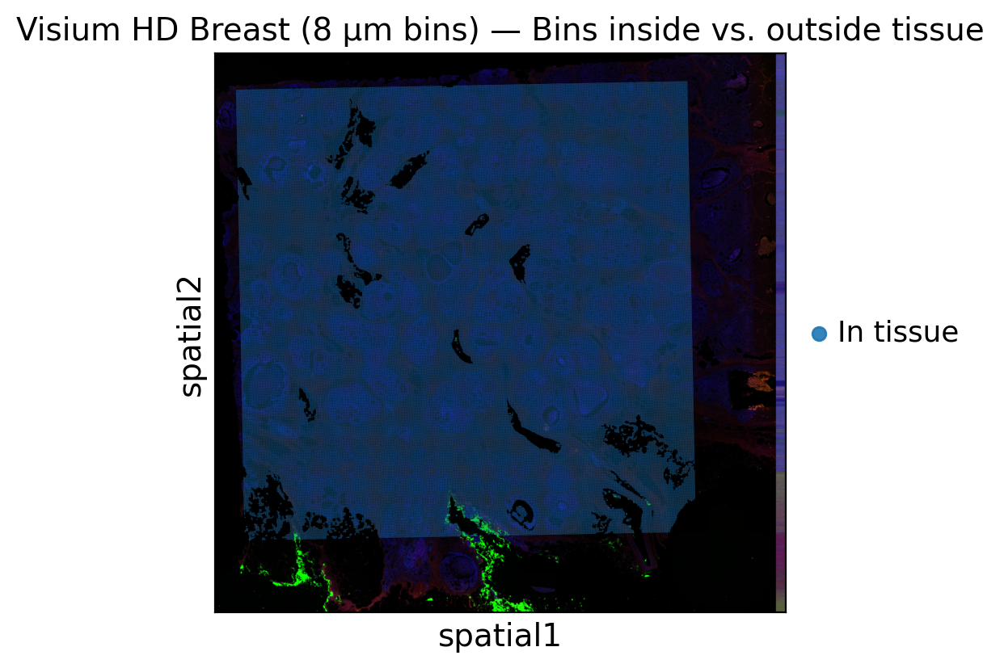

In [4]:
# Draw all bins (colored by 'in_tissue') using Squidpy's fast scatter plot
adata.obs["in_tissue"] = adata.obs["in_tissue"].map({0: "Off tissue", 1: "In tissue"}).astype("category")
sq.pl.spatial_scatter(
    adata,
    color="in_tissue",
    img=True,
    size=0.8,
    alpha=0.9,
    title=f"{adata.uns['dataset_name']} — Bins inside vs. outside tissue"
)


<div style="border:2px solid #d9534f; border-radius:8px; padding:12px; background-color:#fff5f5;">
  
### 🧠 Reflection

**Q1.** How do you know the **spatial alignment** is already done for this dataset?  
<details>
<summary>💬 Click to reveal answer</summary>

Because the spatial barcodes (from `tissue_positions_list.csv`) are already registered to the image in the `spatial/` folder.  
We can directly overlay the bin coordinates on the aligned image (no manual alignment step in the notebook).
In a typical workflow, you would inspect/adjust this alignment in **Loupe Browser**, but for this demo it’s already complete.
</details>

---

**Q2.** Why do you only see **“In tissue”** bins in this filtered dataset?  
<details>
<summary>💬 Click to reveal answer</summary>

We loaded the **filtered** 10x matrix (`filtered_feature_bc_matrix.h5`), which includes only barcodes **inside** the tissue mask.  
Off-tissue bins were removed upstream by Space Ranger.  
That’s expected and simplifies our QC/visualization steps.
</details>

</div>

## **Part 2 — Compute and interpret spatial Quality Control (QC) metrics**


In this section, you will:
1. **Understand** what total counts, detected genes, and % mitochondrial mean in a spatial context.  
2. **Compute** these metrics using Scanpy.  
3. **Explore** their distributions to detect low-quality bins.  
4. **Set thresholds** and classify bins as Pass/Fail.  
5. **Visualize** the spatial distribution of QC results.  
6. **Reflect** on how QC filtering impacts downstream analysis.

> Note: This Visium HD FFPE dataset is sparse by design (8 µm bins). Expect low counts and genes per bin.  
> Choose *gentle* thresholds to avoid losing biology.
---

## 🧬 Understanding the QC metrics

Before computing the quality-control (QC) metrics, let’s clarify what each one means:

| Metric | What it measures | Why it matters |
|:-------|:-----------------|:----------------|
| **`total_counts`** | The total number of detected transcripts (UMIs) per bin | Reflects how much RNA was captured in each spatial bin. Very low values often indicate empty or damaged regions. |
| **`n_genes_by_counts`** | The number of different genes detected per bin | Reflects library complexity. Bins with few detected genes typically correspond to background or poor capture. |
| **`pct_counts_mt`** | The fraction of mitochondrial transcripts (e.g. *MT-CO1*, *MT-ND1*) | High percentages can indicate degraded RNA, damaged cells, or tissue edges. In FFPE data, however, mitochondrial RNA is often low or absent. |

> 💡 *Together, these metrics describe both the amount and quality of the RNA captured in each spatial bin.*

In the upcoming step, we’ll compute these metrics directly from our `AnnData` object (`adata`) and inspect their distributions to decide on suitable filtering thresholds.

---
### 2.1 Compute QC metrics (Code)

In [5]:
# Identify mitochondrial genes using gene symbols if present
if "gene_symbols" in adata.var.columns:
    symbols = adata.var["gene_symbols"].astype(str)
elif "gene_symbol" in adata.var.columns:
    symbols = adata.var["gene_symbol"].astype(str)
elif "feature_name" in adata.var.columns:
    symbols = adata.var["feature_name"].astype(str)
else:
    symbols = adata.var_names.astype(str)

adata.var["mt"] = np.array(pd.Series(symbols).str.upper().str.startswith("MT-"))

# Calculate QC metrics (adds: total_counts, n_genes_by_counts, pct_counts_mt)
sc.pp.calculate_qc_metrics(
    adata, qc_vars=["mt"], percent_top=None, log1p=False, inplace=True
)

# Quick peek (optional)
adata.obs[["total_counts","n_genes_by_counts","pct_counts_mt"]].head()

,total_counts,n_genes_by_counts,pct_counts_mt
s_008um_00269_00526-1,214.0,195,4.672897
s_008um_00260_00253-1,189.0,170,2.116402
s_008um_00433_00599-1,13.0,12,0.000000
s_008um_00266_00304-1,122.0,102,3.278688
s_008um_00154_00449-1,145.0,129,2.758621


---

### 2.2 Inspect distributions to pick thresholds (Code)

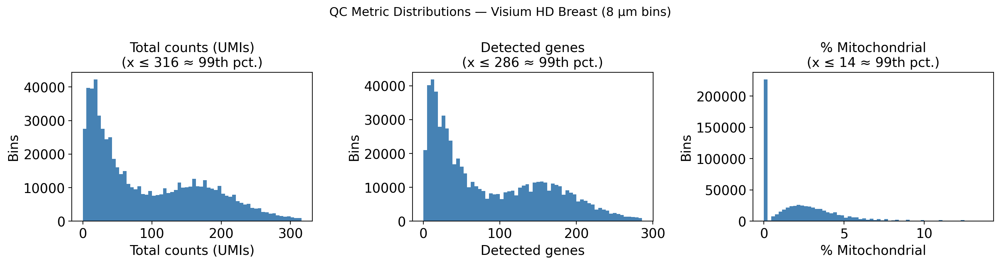

In [6]:
# --- Helper for dynamic x-axis ---
def get_limit(values, percentile=99):
    """Return the percentile-based max value, ignoring NaNs."""
    values = pd.Series(values).dropna()
    return np.nanpercentile(values, percentile) if len(values) > 0 else None

# --- Prepare figure ---
fig, axes = plt.subplots(1, 3, figsize=(15, 4))
metrics = [
    ("total_counts", "Total counts (UMIs)"),
    ("n_genes_by_counts", "Detected genes"),
    ("pct_counts_mt", "% Mitochondrial"),
]

for ax, (col, label) in zip(axes, metrics):
    if col not in adata.obs:
        ax.set_visible(False)
        continue
    vals = adata.obs[col].astype(float)
    vmax = get_limit(vals, 99)
    if vmax:
        vals = vals[vals <= vmax]
    ax.hist(vals, bins=60, color="steelblue", edgecolor="none")
    ax.set_title(f"{label}\n(x ≤ {vmax:.0f} ≈ 99th pct.)")
    ax.set_xlabel(label)
    ax.set_ylabel("Bins")

plt.suptitle("QC Metric Distributions — Visium HD Breast (8 µm bins)", fontsize=13)
plt.tight_layout()
plt.show()


---

## 🧭 Interpreting QC distributions and setting thresholds

Now that we’ve visualized the **QC metric distributions**, we can decide on
appropriate thresholds for filtering out low-quality bins.

### 🧪 What the distributions tell us
- **Total counts (UMIs)** measure the total RNA captured in each 8 µm bin.  
  Very low values often correspond to background or empty regions.  
- **Detected genes** show library complexity per bin.  
  Bins with very few detected genes typically lack biological signal.  
- **% Mitochondrial** is an indicator of degraded RNA or cell damage,  
  but in **FFPE Visium HD** data, mitochondrial reads are generally rare.

### 🎯 Setting thresholds
Because these are **tiny 8 µm bins**, we use *gentle* cutoffs —  
enough to remove clear noise, but not to discard biologically meaningful signal.

| Metric | What to remove | Example threshold |
|:--------|:----------------|:------------------|
| `total_counts` | Very low capture (likely background) | ≥ 10 UMIs |
| `n_genes_by_counts` | Bins with few detected genes | ≥ 10 genes |
| `pct_counts_mt` | Excessive mitochondrial content (if informative) | ≤ 5 % |

> 💬 **Tip:** These values are starting points, not universal rules.  
> Always inspect your histograms to see where the “background cloud” ends  
> and the real tissue signal begins.

---

<div style="border:2px solid #d9534f; border-radius:8px; padding:12px; background-color:#fff5f5;">

### 🧠 Reflection

**Q1.** Where would you draw the line between “signal” and “noise” in these histograms?  
<details>
<summary>💬 Click to reveal answer</summary>
Look for the point where the large cluster of near-zero bins (background) tapers off  
and the main tissue population begins — that’s your cutoff.
</details>

---

**Q2.** Why do we only filter **low-count** bins in spatial transcriptomics,  
but both low and high counts in single-cell data?  
<details>
<summary>💬 Click to reveal answer</summary>
In Visium HD, high counts often reflect real biological regions  
(dense tumor or epithelium) rather than doublets.  
We remove only low-quality bins to filter background noise.
</details>

---

**Q3.** How might overly strict filtering bias downstream analysis?  
<details>
<summary>💬 Click to reveal answer</summary>
It can remove biologically relevant low-expression areas  
(e.g. stroma, necrotic zones), distorting spatial context  
and cluster composition.
</details>

</div>

---


## 2.3 Mark low-quality bins (pass/fail) on the slide

Using the histograms above, we now **set thresholds** and label each bin as **Pass/Fail** for:
- `total_counts` (library size, low is bad),
- `n_genes_by_counts` (library complexity, low is bad),
- `pct_counts_mt` (mitochondrial fraction, high is bad — if informative in FFPE).

We’ll then **visualize pass/fail** spatially and create a filtered object for the next steps.


In [7]:
# === 2.3 Set thresholds (Optionally: edit these after looking at histograms) ===
# Use your chosen values (round, keep gentle for FFPE/HD):
LIB_MIN   = 10.0   # total_counts >= 50 UMIs
GENES_MIN = 10.0   # n_genes_by_counts >= 50 genes
MT_MAX    = 5.0    # pct_counts_mt <= 5%  (set only if mito is informative)

print("Using thresholds:")
print(f"  total_counts   ≥ {LIB_MIN}")
print(f"  n_genes_by_counts ≥ {GENES_MIN}")
print(f"  pct_counts_mt  ≤ {MT_MAX}%  (ignored if mito% not informative)")


Using thresholds:
  total_counts   ≥ 10.0
  n_genes_by_counts ≥ 10.0
  pct_counts_mt  ≤ 5.0%  (ignored if mito% not informative)


QC summary:
  Library   : keep 604,835/663,857 (91.1%)
  Genes     : keep 602,675/663,857 (90.8%)
  Mito %    : keep 588,919/663,857 (88.7%)
  OVERALL   : keep 536,626/663,857 (80.8%)


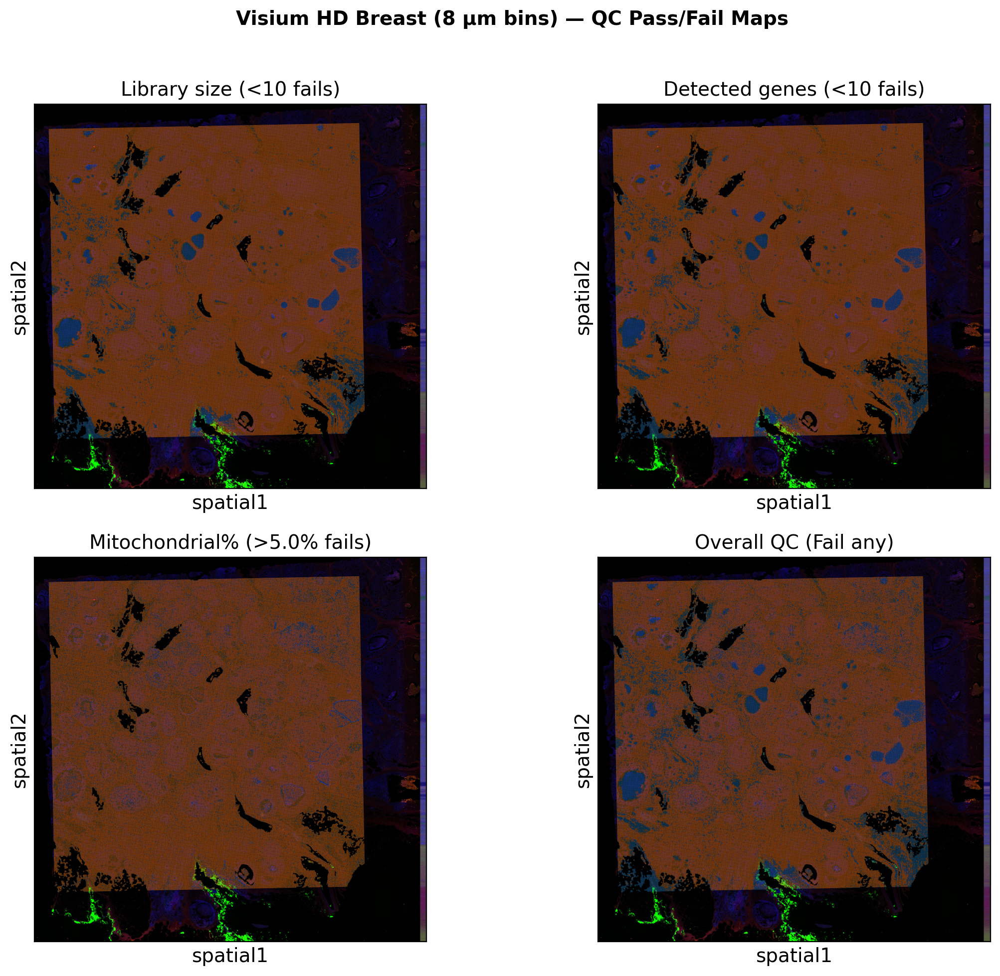


Created `adata_filt` with 536,626 bins for downstream steps.


In [8]:
# Pass/fail masks
lib_pass   = adata.obs["total_counts"] >= LIB_MIN
genes_pass = adata.obs["n_genes_by_counts"] >= GENES_MIN

pct = adata.obs.get("pct_counts_mt", pd.Series(np.nan, index=adata.obs.index)).astype(float)
mt_informative = np.isfinite(pct).any()
mt_pass = (pct <= MT_MAX) if mt_informative else pd.Series(True, index=adata.obs.index)

# Helper to add readable categories
def add_status(colname, mask_pass, pass_label, fail_label):
    labels = np.where(mask_pass, pass_label, fail_label)
    adata.obs[colname] = pd.Categorical(labels, categories=[fail_label, pass_label], ordered=True)
    return colname

qc_lib     = add_status("qc_lib",   lib_pass,   "Pass (library)", f"Low library < {LIB_MIN:,.0f}")
qc_genes   = add_status("qc_genes", genes_pass, "Pass (genes)",   f"Low genes < {GENES_MIN:,.0f}")
qc_mito    = add_status("qc_mito",  mt_pass,    "Pass (mito%)",   f"High mito > {MT_MAX:.1f}%")
keep_mask  = lib_pass & genes_pass & mt_pass
qc_overall = add_status("qc_overall", keep_mask, "Pass all", "Fail any")

# Summary
n = adata.n_obs
print("QC summary:")
print(f"  Library   : keep {lib_pass.sum():,}/{n:,} ({100*lib_pass.mean():.1f}%)")
print(f"  Genes     : keep {genes_pass.sum():,}/{n:,} ({100*genes_pass.mean():.1f}%)")
if mt_informative:
    print(f"  Mito %    : keep {mt_pass.sum():,}/{n:,} ({100*mt_pass.mean():.1f}%)")
else:
    print("  Mito %    : skipped (not informative in this FFPE dataset)")
print(f"  OVERALL   : keep {keep_mask.sum():,}/{n:,} ({100*keep_mask.mean():.1f}%)")

# --- Define what to plot ---
qc_panels = [
    ("qc_lib",   f"Library size (<{LIB_MIN:,.0f} fails)"),
    ("qc_genes", f"Detected genes (<{GENES_MIN:,.0f} fails)"),
    ("qc_mito",  f"Mitochondrial% (>{MT_MAX:.1f}% fails)" if mt_informative else "Mitochondrial% (not informative)"),
    ("qc_overall", "Overall QC (Fail any)"),
]

# --- Create 2×2 figure ---
fig, axes = plt.subplots(2, 2, figsize=(12, 10))
axes = axes.flatten()

for ax, (col, title) in zip(axes, qc_panels):
    if col not in adata.obs:
        ax.set_visible(False)
        continue
    sq.pl.spatial_scatter(
        adata,
        color=col,
        img=True,
        size=0.8,
        alpha=0.9,
        legend_loc=None,
        ax=ax,
        title=title,
    )

plt.suptitle(f"{adata.uns.get('dataset_name','Dataset')} — QC Pass/Fail Maps", fontsize=14, weight="bold")
plt.tight_layout(rect=[0, 0, 1, 0.97])
plt.show()

# Prepare filtered object for next step
adata_filt = adata[keep_mask].copy()
print(f"\nCreated `adata_filt` with {adata_filt.n_obs:,} bins for downstream steps.")

<div style="border:2px solid #d9534f; border-radius:8px; padding:12px; background-color:#fff5f5;">

### 🧠 Reflection

**Q1.** How did the histograms help you pick thresholds?  
<details>
<summary>💬 Click to reveal answer</summary>
By revealing the **left tail** of low library size / genes and the **right tail** of mito%.  
We choose thresholds that remove clear outliers while preserving most bins.
</details>

---

**Q2.** Did low-quality bins cluster spatially? What might cause that?  
<details>
<summary>💬 Click to reveal answer</summary>
Yes, often at **edges, tears, or weak capture areas**, or due to **biological differences** (cell density, ECM).  
Spatial maps prevent over-filtering biologically meaningful regions.
</details>

---

**Q3.** What changed after filtering?  
<details>
<summary>💬 Click to reveal answer</summary>
Plots become cleaner, with fewer noisy bins. This improves normalization and downstream clustering/DE.
</details>

</div>

# Part 3 — Normalization, HVGs, and a quick embedding

In this part, we’ll prepare our filtered Visium HD dataset (`adata_filt`) for downstream analysis.

Our goal is to move from **raw counts** to a **low-dimensional embedding** where we can explore spatial patterns and structure within the tissue.

---

### 🧭 Goals

We’ll perform four key steps:

1. **Normalize counts** → make bins comparable by scaling for total RNA captured.  
2. **Select highly variable genes (HVGs)** → keep the most informative features.  
3. **Reduce dimensionality (PCA)** → summarize variation across thousands of genes.  
4. **Quick embedding and clustering (UMAP + Leiden)** → visualize tissue domains in 2D.

---

### ⚡ Why only a *subset* for the embedding?

Visium HD at 8 µm resolution contains **hundreds of thousands of bins**.  
Running a full UMAP on all bins is **slow and memory-intensive** — especially in teaching or laptop environments.

So in this tutorial:
- We’ll **normalize and compute HVGs on all bins** (so biology is preserved).  
- But we’ll **run PCA/UMAP/clustering on a random subset** (e.g. 20–30 k bins) for fast visualization.

This approach keeps results biologically representative, yet interactive and efficient.

---

## 3.1 Normalize counts & log-transform (Code)

**Why normalize?**  
Bins differ in capture efficiency (library size).  
We rescale each bin so its total counts sum to 10,000 (known as **Counts Per 10k, or CP10K**).

**Why log-transform?**  
Gene counts span orders of magnitude.  
Applying `log1p(x) = log(1 + x)` compresses extreme values and makes patterns easier to detect.

We’ll normalize the filtered data (`adata_filt`), keeping the raw counts for reference.


In [9]:
# --- Use the filtered data from Part 2 ---
adata_run = adata_filt.copy()
print(f"Working with filtered data: {adata_run.n_obs:,} bins × {adata_run.n_vars:,} genes")

# --- Preserve raw counts before normalization ---
if "counts" not in adata_run.layers:
    adata_run.layers["counts"] = adata_run.X.copy()

# --- Step 1: Library-size normalization (Counts Per 10k, CP10K) ---
sc.pp.normalize_total(adata_run, target_sum=1e4, inplace=True)

# --- Step 2: Log1p transformation ---
sc.pp.log1p(adata_run)

# --- Sanity check: compare total counts before vs after normalization ---
tot_before = np.asarray(adata_run.layers["counts"].sum(axis=1)).ravel()
tot_after  = np.asarray(adata_run.X.sum(axis=1)).ravel()

print("✅ Normalization complete.")
print(f"   Median total (raw counts): {np.median(tot_before):.0f}")
print(f"   Median total (after CP10K normalization): {np.median(tot_after):.0f}")
print("   Data are now ready for HVG selection and dimensionality reduction.")

Working with filtered data: 536,626 bins × 18,085 genes
✅ Normalization complete.
   Median total (raw counts): 90
   Median total (after CP10K normalization): 400
   Data are now ready for HVG selection and dimensionality reduction.


## 3.2 Select Highly Variable Genes (HVGs)

After normalization, we identify **Highly Variable Genes (HVGs)** — genes whose expression varies
substantially across bins. These genes carry the most **biological signal** for downstream embeddings.

### 🧬 Why select HVGs?
Not all genes carry the same amount of information:
- Some are **housekeeping genes**, expressed everywhere (little variation).  
- Others vary strongly between tissue regions — these drive **biological structure**.

By focusing on HVGs:
- We **reduce noise** (ignore uninformative genes).  
- We **speed up** dimensionality reduction (PCA/UMAP).  
- We **highlight biologically relevant variation** in spatial patterns.

### 📈 Interpreting the mean–variance plot
The plot shows each gene’s **average expression (x-axis)** vs **variance (y-axis)** across all bins:
- Most genes follow a general **trend line** — higher mean usually means higher variance.  
- Genes **above the trend** have **more variation than expected** → likely biologically informative.  
- Genes **below the line** are stable across tissue (e.g., ribosomal or housekeeping genes).  

The highlighted (colored) points are the **HVGs** that will be used for PCA and clustering.

> 💡 The selection is statistical — it doesn’t “know” biology,  
> but it often rediscovers biologically meaningful patterns like tumor–stroma or immune gradients.

We’ll keep about **3,000 HVGs** for this dataset — a good balance between signal and speed.


✅ Identified 3,000 highly variable genes.


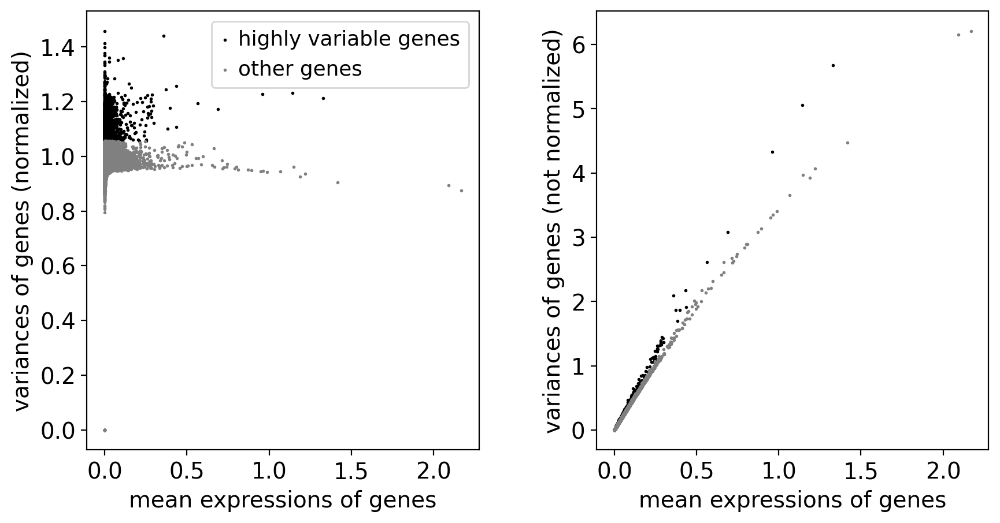

,means,variances,variances_norm,highly_variable,gene
LBHD2,0.000024,0.000153,1.456949,True,LBHD2
IGKC,0.359440,2.088533,1.439601,True,IGKC
LYPD2,0.000022,0.000141,1.412782,True,LYPD2
ZCCHC13,0.000023,0.000139,1.397672,True,ZCCHC13
NPBWR1,0.000022,0.000133,1.377659,True,NPBWR1
MRAP,0.000102,0.000626,1.368080,True,MRAP
RETNLB,0.000022,0.000133,1.367438,True,RETNLB
IGHG3,0.026246,0.154704,1.359798,True,IGHG3
IGHG1,0.111991,0.644758,1.357082,True,IGHG1
IGHA1,0.081618,0.470018,1.350923,True,IGHA1


Data for embeddings: 536,626 bins × 3,000 HVGs


In [10]:
# === 3.2 Select Highly Variable Genes (HVGs) ===
# Identify HVGs using Scanpy’s variance-based method
sc.pp.highly_variable_genes(
    adata_run,
    n_top_genes=3000,
    flavor="seurat_v3",  # variance modeling inspired by Seurat v3, fully Python
    subset=False
)

# Summary
hvg_n = int(adata_run.var["highly_variable"].sum())
print(f"✅ Identified {hvg_n:,} highly variable genes.")

# --- Plot mean–variance relationship ---
sc.pl.highly_variable_genes(adata_run)

# --- Create a clean HVG table ---
# Some columns differ by flavor, so check dynamically
cols_available = [c for c in ["means", "variances", "variances_norm", "highly_variable"] if c in adata_run.var.columns]
hvg_table = (
    adata_run.var.loc[:, cols_available]
    .assign(gene=adata_run.var_names)
    .sort_values(
        by="variances_norm" if "variances_norm" in adata_run.var.columns else "variances",
        ascending=False
    )
)

# --- Display top 25 HVGs ---
display(hvg_table.head(25))

# --- Create a reduced object with only HVGs ---
adata_hvg = adata_run[:, adata_run.var["highly_variable"]].copy()
print(f"Data for embeddings: {adata_hvg.n_obs:,} bins × {adata_hvg.n_vars:,} HVGs")


<div style="border:2px solid #d9534f; border-radius:8px; padding:12px; background-color:#fff5f5;">

### 🧠 Reflection — Inspecting HVGs

**Q1.** Do the top HVGs include genes you’d expect to vary spatially in this tissue (e.g., epithelial, stromal, or immune markers)?  
<details>
<summary>💬 Click to reveal answer</summary>
Yes — in this **Visium HD breast cancer** sample, HVGs such as  
**IGKC**, **IGHG1**, and **JCHAIN** point to **B-cell and plasma-cell–rich immune niches**,  
while **COL1A1**, **COL3A1**, and **SFRP2/SFRP4** mark **stromal and fibroblast regions**.  
These spatially distinct gene patterns reflect true biological organization in the tissue.
</details>

---

**Q2.** How might changing the number of HVGs (e.g., 1,000 vs 5,000) affect PCA, UMAP, and clustering in this dataset?  
<details>
<summary>💬 Click to reveal answer</summary>
Using fewer HVGs (≈ 1 000) will emphasize dominant spatial programs  
(e.g., tumor vs stroma vs immune), but may overlook finer patterns.  
Using more HVGs (≈ 5 000) captures subtle variation but increases noise  
and computation time. Around 3 000 provides a good balance for this dataset.
</details>

</div>


## 3.3 Dimensionality reduction with PCA

Now that we’ve selected our **Highly Variable Genes (HVGs)**, we can summarize the expression patterns
into a smaller set of **principal components (PCs)** using **Principal Component Analysis (PCA)**.

### 🎯 What PCA does
- PCA finds **axes (components)** that capture the largest sources of variation in the data.  
- Each PC is a **linear combination of genes**, describing a coordinated expression pattern.  
- The **first few PCs** usually correspond to strong biological contrasts  
  (e.g., tumor vs stroma vs immune regions).  

By reducing 18 000 genes → ~50 PCs, we:
- Greatly **compress** the data while keeping most of the meaningful variation.  
- Remove random noise and redundancy.  
- Prepare the data for graph-based clustering and UMAP embedding.

### 📊 How to interpret the variance plot
We’ll visualize how much total variance each PC explains:
- The **“elbow” point** in the scree plot marks where additional PCs add little new information.  
- Typically, the **first 10–30 PCs** are used for clustering and visualization.

> 💡 **Tip:** PCs are not directly interpretable as genes, but you can inspect their **top-loading genes**  
> to understand which biological programs each component represents.


Running PCA on highly variable genes...


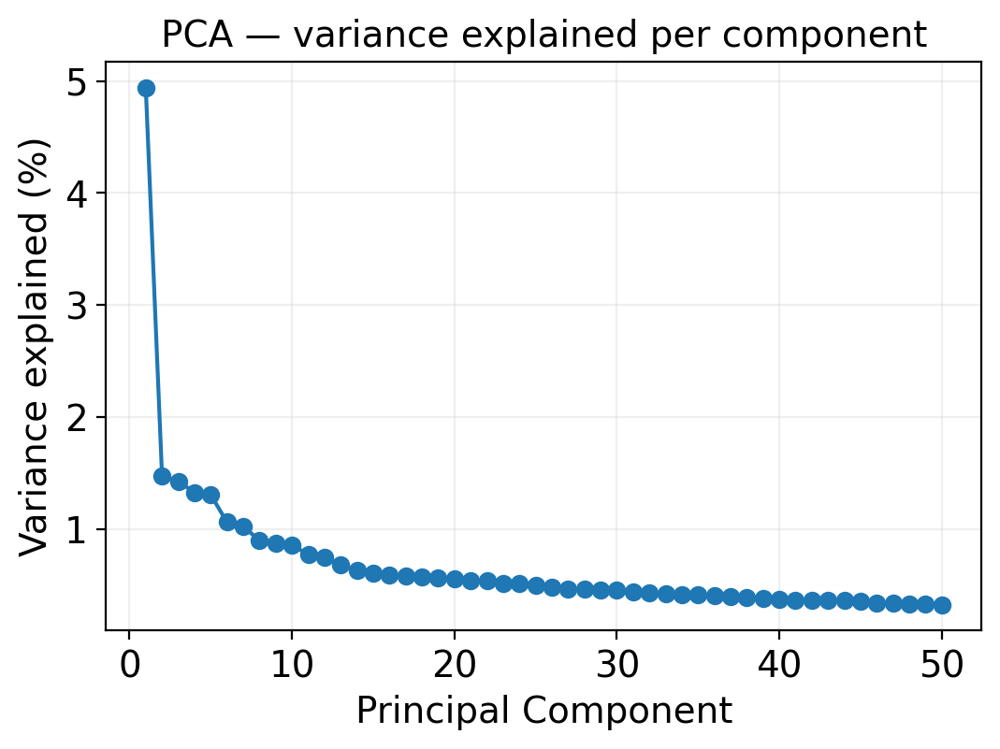

✅ PCA complete — 50 PCs computed.
50 PCs explain 90% of the total variance.


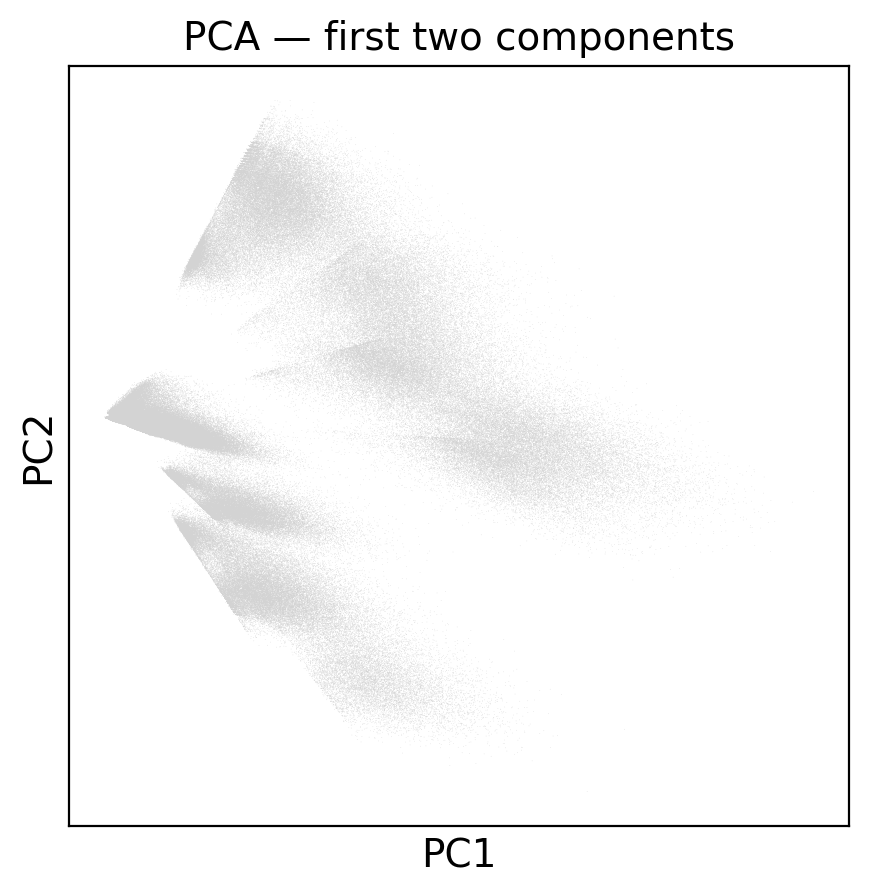

In [11]:
# === 3.3 Run PCA ===
print("Running PCA on highly variable genes...")

sc.tl.pca(adata_hvg, svd_solver='arpack')

# --- Inspect explained variance ---
var_exp = adata_hvg.uns['pca']['variance_ratio']
n_pcs = len(var_exp)

plt.figure(figsize=(6,4))
plt.plot(range(1, n_pcs+1), 100*var_exp, marker='o')
plt.title("PCA — variance explained per component")
plt.xlabel("Principal Component")
plt.ylabel("Variance explained (%)")
plt.grid(alpha=0.3)
plt.show()

# --- Scree summary ---
cumulative = 100 * pd.Series(var_exp).cumsum()
elbow = (cumulative < 90).sum() + 1
elbow = min(elbow, n_pcs)

print(f"✅ PCA complete — {n_pcs} PCs computed.")
print(f"{elbow} PCs explain 90% of the total variance.")

# --- Optional: visualize first two PCs ---
sc.pl.pca_scatter(adata_hvg, color=None, title="PCA — first two components")


<div style="border:2px solid #d9534f; border-radius:8px; padding:12px; background-color:#fff5f5;">

### 🧠 Reflection — Interpreting PCA patterns

**Q1.** Why do only the first few PCs explain most of the variance?  
<details>
<summary>💬 Click to reveal answer</summary>
Because PCA captures global structure first — broad biological contrasts like  
tumor vs. stroma — while later PCs describe smaller, more specific patterns.  
This rapid variance drop is expected for spatial transcriptomics data.
</details>

---

**Q2.** The PCA scatter doesn’t show clear clusters. What does that suggest?  
<details>
<summary>💬 Click to reveal answer</summary>
That variation across the tissue is **continuous rather than discrete**,  
such as gradual changes in cell composition or microenvironment,  
which we’ll visualize better with **UMAP**.
</details>

---

**Q3.** Why might PCA components not align directly with visible tissue regions yet?  
<details>
<summary>💬 Click to reveal answer</summary>
Because PCA captures **gene-level variance**, not spatial location.  
We’ll later combine it with graph-based clustering and the spatial layout  
to reveal biologically meaningful domains.
</details>

</div>


## 3.4 From PCA to UMAP, Clustering, and Spatial Mapping

Now that we’ve computed **Principal Component Analysis (PCA)**,  
we can interpret what those components represent and use them to uncover **spatial transcriptional patterns**.

---

### 🧮 Understanding PCA results

PCA reduces thousands of genes into a smaller set of **principal components (PCs)**  
that summarize the main axes of biological variation in the dataset.

Each PC captures a **coordinated gene-expression program** across the tissue —  
for example, one PC might distinguish **tumor epithelium** from **stroma**,  
while another might reflect **immune infiltration** or **extracellular matrix composition**.

The **variance-explained** (or “elbow”) plot shows how much of the total variation  
each PC contributes:

- The **first few PCs** capture major biological differences.  
- After the “elbow,” additional PCs mostly represent noise or minor effects.  

---

### 🧭 How many PCs should we use?

When we ran PCA, we computed **50 components** so we could visualize how much variance each one explains.  
This does *not* mean we’ll use all 50 in later steps.

The variance-explained (“elbow”) plot helps us decide how many PCs capture real biological signal.

- The curve drops sharply for the first few components and then **flattens around 30**.  
- This “elbow” marks the point where additional PCs add little new information.  
- We therefore **use ≈ 30 PCs** for the neighborhood graph, clustering, and UMAP.

> 💡 Computing 50 PCs gives flexibility for inspection, but only the **first ~30 carry strong signal**.  
> Using too few may miss subtle variation; using too many can add noise.

---

### 🔗 From PCA to neighborhood graphs

Each spot (bin) is now represented by its **PCA coordinates** —  
a compact fingerprint of its transcriptomic profile.

We use these PCs to:
1. Build a **k-nearest neighbor (kNN)** graph linking transcriptionally similar bins.  
2. Apply **Leiden clustering** to find coherent transcriptional domains.  
3. Generate a **UMAP embedding** to visualize relationships between clusters.  
4. Map those clusters back onto the tissue image to inspect spatial organization.

> 💡 **Key idea:** PCA simplifies the data; Leiden and UMAP reveal structure; spatial mapping reconnects it to histology.

---

### 🧭 What is Leiden clustering?

Leiden clustering detects **communities** in a graph — groups of spots that are more connected to each other than to the rest of the tissue.  
It’s based on **network modularity optimization**, meaning it tries to find partitions that maximize within-cluster similarity.

- Works directly on the **kNN graph** created from PCA space.  
- Is **unsupervised** — it doesn’t need predefined labels.  
- Produces clusters that often correspond to **spatial or cell-type domains**.

The **resolution parameter** (`resolution=0.5`) controls **cluster granularity**:
- Lower values → fewer, larger clusters (coarser regions).  
- Higher values → more, smaller clusters (finer segmentation).  

> 💬 **Tip:** Adjust `resolution` interactively to see how the spatial domains split or merge.

---

### 🧩 Alternative clustering approaches

Leiden is popular because it’s robust, scalable, and well-integrated into Scanpy.  
However, other clustering strategies exist and are worth mentioning:

| Method | Description | When to use |
|:--------|:-------------|:-------------|
| **Louvain** | Older modularity-based method (predecessor of Leiden). | Simple, fast, similar results. |
| **K-means** | Assigns clusters by centroid proximity in PCA space. | For continuous or non-graph data. |
| **Hierarchical clustering** | Builds nested tree-like groupings. | When you want cluster relationships. |
| **Gaussian Mixture Models (GMM)** | Probabilistic, assumes Gaussian-shaped clusters. | For modeling continuous variation. |

For spatial transcriptomics, **Leiden** strikes a strong balance between **speed, interpretability, and biological coherence**,  
making it ideal for teaching and exploratory analysis.

---

### ⚡ Why we use a subset for UMAP and clustering

The Visium HD dataset contains over **600,000 bins**.  
To make the process interactive and fast on laptops, we’ll use a **random subset** of ~50,000 bins for UMAP and clustering.  
This subset still preserves overall spatial structure while greatly improving responsiveness.

> 🧩 All normalization, HVG selection, and PCA were done on the full filtered dataset (`adata_hvg`).
> We’re now using a subset (`adata_sub`) only for embedding and clustering visualization.

In [12]:
# === Deterministic subset for UMAP/Leiden (simple & reproducible) ===
import numpy as np

SEED = 42
N_SUBSET = 50_000

rng = np.random.default_rng(SEED)
if adata_hvg.n_obs > N_SUBSET:
    subset_idx = rng.choice(adata_hvg.n_obs, N_SUBSET, replace=False)
else:
    subset_idx = np.arange(adata_hvg.n_obs)

adata_sub = adata_hvg[subset_idx].copy()
adata_hvg.uns["subset_seed"] = SEED
adata_hvg.uns["subset_idx"] = subset_idx  # record for reproducibility

print(f"📉 Subset for teaching UMAP: {adata_sub.n_obs:,}/{adata_hvg.n_obs:,} bins (seed={SEED})")


📉 Subset for teaching UMAP: 50,000/536,626 bins (seed=42)


✅ UMAP & Leiden clustering complete — found 16 clusters.
   (Built using PCA-reduced data from HVGs: adata_sub.obsm['X_pca'])


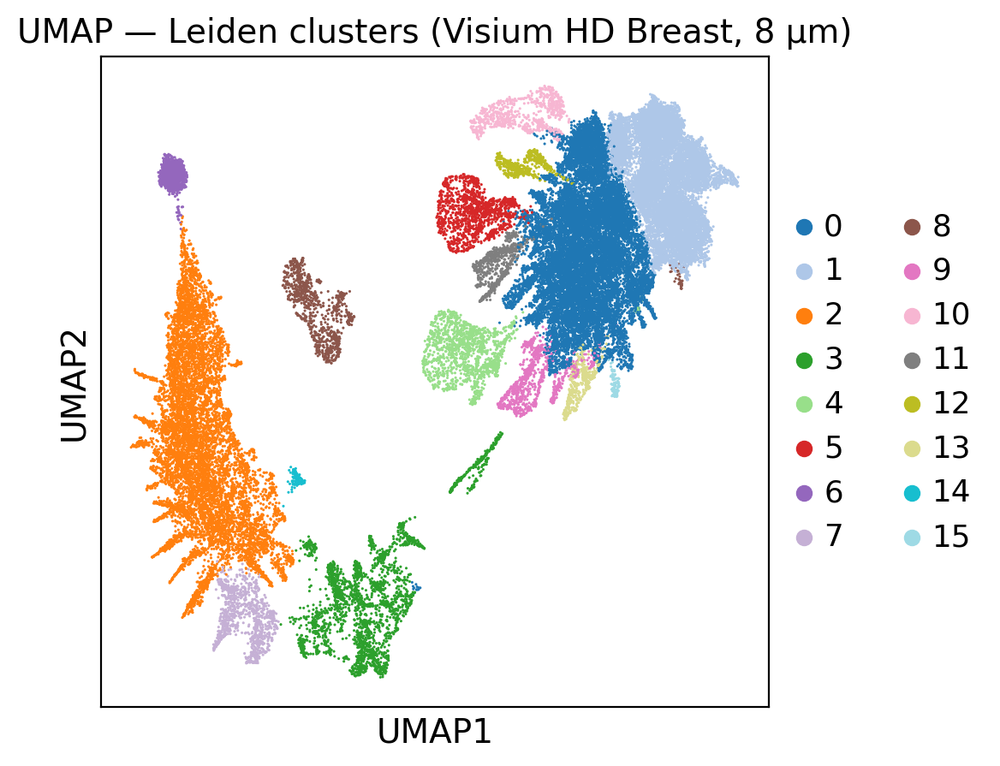

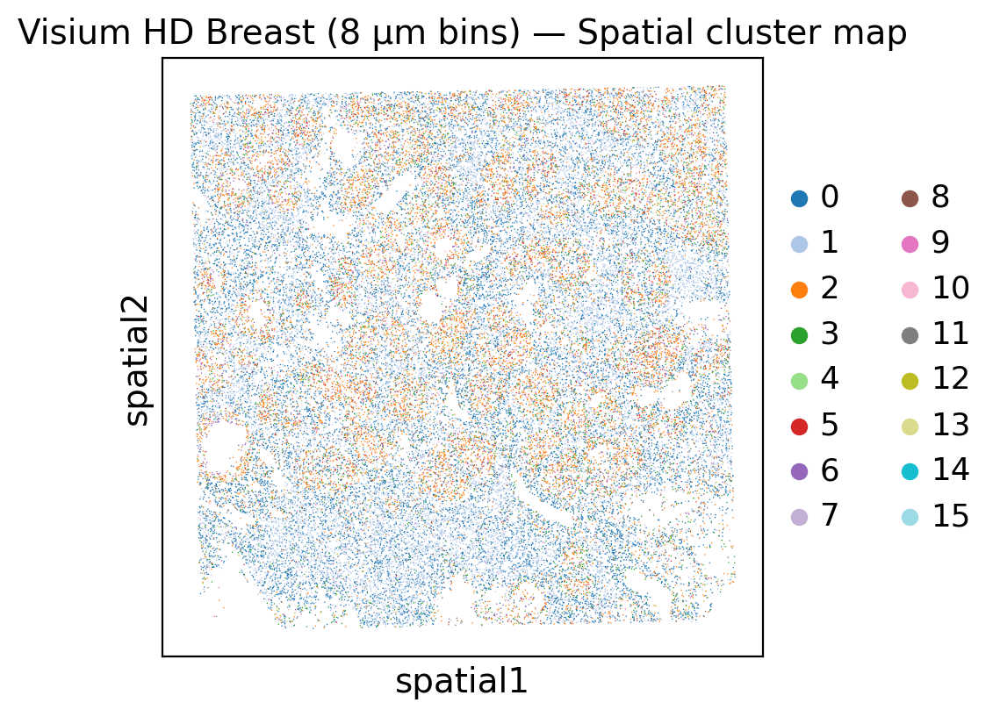

In [14]:
# --- Build neighborhood graph from first 30 PCs ---
sc.pp.neighbors(adata_sub, n_neighbors=20, n_pcs=30)

# --- Compute UMAP embedding ---
sc.tl.umap(adata_sub)

# --- Leiden clustering ---
sc.tl.leiden(adata_sub, resolution=0.2)

# --- Summary ---
n_clusters = adata_sub.obs["leiden"].nunique()
print(f"✅ UMAP & Leiden clustering complete — found {n_clusters} clusters.")
print("   (Built using PCA-reduced data from HVGs: adata_sub.obsm['X_pca'])")

# --- Plot 1: UMAP embedding ---
sc.pl.umap(
    adata_sub,
    color="leiden",
    palette="tab20",
    size=5,
    title=f"UMAP — Leiden clusters (Visium HD Breast, 8 µm)",
)

# --- Plot 2: Spatial cluster map ---
sq.pl.spatial_scatter(
    adata_sub,
    color="leiden",
    img=False,
    size=2.0,
    alpha=1.0,
    title=f"{adata_sub.uns.get('dataset_name', 'Dataset')} — Spatial cluster map",
)


<div style="border:2px solid #0275d8; border-radius:8px; padding:12px; background-color:#f0f8ff;">

### 🧠 Reflection

**Q1.** Why do we perform UMAP and clustering on a random subset rather than all 600k bins?  
<details><summary>💬 Click to reveal answer</summary>
Because building the full neighbor graph is computationally heavy.  
Using a subset makes it feasible to explore interactively while still capturing overall structure.  
For final analyses, one could scale this to the full dataset on a high-memory machine.
</details>

---

**Q2.** What would happen if we used too few PCs or too few HVGs before this step?  
<details><summary>💬 Click to reveal answer</summary>
We might miss important variation — clusters could merge or lose biological meaning.  
Choosing enough PCs (~30) and HVGs (~3,000) balances speed and signal.
</details>

---

**Q3.** What does the Leiden algorithm actually cluster — and why do we use a kNN graph?  
<details><summary>💬 Click to reveal answer</summary>
Leiden detects communities on a graph where nodes (bins) are connected if they have similar PCA profiles.  
This allows clusters to follow natural, non-spherical biological patterns.
</details>

---

**Q4.** How does the *resolution* parameter influence the biological interpretation of clusters?  
<details><summary>💬 Click to reveal answer</summary>
Higher resolution splits tissue into smaller regions, potentially revealing substructures.  
Lower resolution merges them into broader domains.  
Choosing resolution is about balancing biological detail vs. interpretability.
</details>

---

</div>
